### Importación de datos



In [ ]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#0. Creacion de listas

In [ ]:
lista_tienda = tienda.values.tolist()
lista_tienda2 = tienda2.values.tolist()
lista_tienda3 = tienda3.values.tolist()
lista_tienda4 = tienda4.values.tolist()
todas_las_tiendas = [lista_tienda, lista_tienda2, lista_tienda3, lista_tienda4]

#1. Análisis de facturación



In [ ]:
#analisis de facturacion de manera individual

def calcular_facturacion(tienda):
    total = 0
    #Recorre cada producto en la lista de productos
    for producto in tienda:
        precio = float(producto[2])
        #costo_envio = float(producto[3])  # Suponiendo que sea necesario incluir el costo de envio
        total += precio#+costo_envio
    return total #Devuelve el total facturado de la tienda

calcular_facturacion(lista_tienda)

1150880400.0

In [ ]:
#analisis de facturacion de todas las tiendas mostrando de manera ordenada de mayor a menor

def analizar_todas_las_tiendas(lista_tiendas):
    resultados = []
    for i in range(len(lista_tiendas)):
        facturacion = calcular_facturacion(lista_tiendas[i])
        resultados.append((i+1, facturacion))
    # Ordenar por facturación (de mayor a menor)
    resultados_ordenados = sorted(resultados, key=lambda x: x[1], reverse=True)

    print("\n Facturación ordenada de mayor a menor:\n")
    for tienda_num, total in resultados_ordenados:
        print(f"Tienda {tienda_num} facturó: ${total:.2f}")

    # Tienda que más vendió
    tienda_mayor = resultados_ordenados[0]
    # Tienda que menos vendió
    tienda_menor = resultados_ordenados[-1]

    print(f"\n🏆 Tienda con mayor facturación: Tienda {tienda_mayor[0]} (${tienda_mayor[1]:.2f})")
    print(f"💸 Tienda con menor facturación: Tienda {tienda_menor[0]} (${tienda_menor[1]:.2f})")

analizar_todas_las_tiendas(todas_las_tiendas)


 Facturación ordenada de mayor a menor:

Tienda 1 facturó: $1150880400.00
Tienda 2 facturó: $1116343500.00
Tienda 3 facturó: $1098019600.00
Tienda 4 facturó: $1038375700.00

🏆 Tienda con mayor facturación: Tienda 1 ($1150880400.00)
💸 Tienda con menor facturación: Tienda 4 ($1038375700.00)


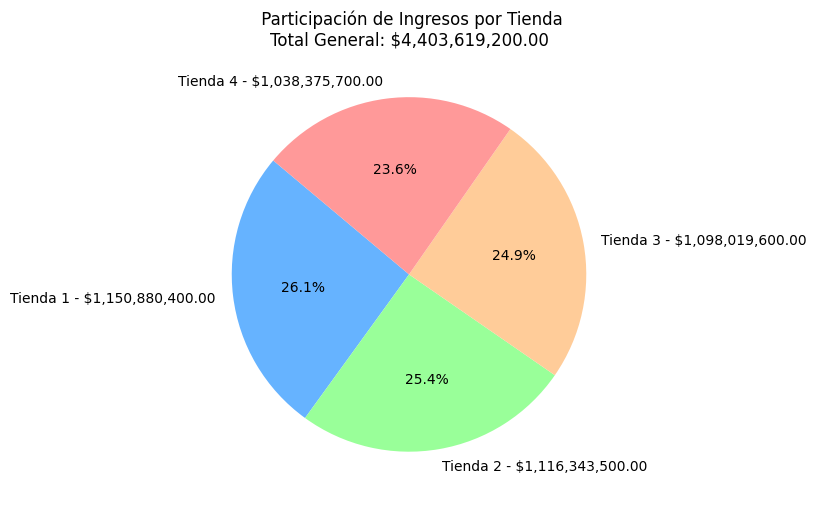

In [ ]:
import matplotlib.pyplot as plt

def graficar_ingresos_por_tienda_con_analisis(lista_tiendas):
    ingresos = []
    etiquetas = []

    for i, tienda in enumerate(lista_tiendas):
        ingreso = calcular_facturacion(tienda)
        ingresos.append(ingreso)
        etiquetas.append(f'Tienda {i+1}')

    total_ingresos = sum(ingresos)

    # Actualizar etiquetas para incluir el ingreso de cada tienda
    etiquetas_detalladas = [f'{etiquetas[i]} - ${ingresos[i]:,.2f}' for i in range(len(ingresos))]

    colores = ['#66b3ff','#99ff99','#ffcc99','#ff9999']

    plt.figure(figsize=(8, 8))
    plt.pie(
        ingresos,
        labels=etiquetas_detalladas,
        autopct='%1.1f%%',
        startangle=140,
        colors=colores
    )
    plt.title(f' Participación de Ingresos por Tienda\nTotal General: ${total_ingresos:,.2f}')
    plt.tight_layout()
    plt.show()

graficar_ingresos_por_tienda_con_analisis(todas_las_tiendas)

In [ ]:
#analisis de facturacion de una tienda ordenando sus ganancias por año

from collections import defaultdict, OrderedDict

def facturacion_por_anio_tienda(tienda):
    facturacion_anual = defaultdict(float)

    for venta in tienda:
        try:
            precio = float(venta[2])
            fecha = venta[4]
            anio = int(fecha.split('/')[-1])  # Obtenemos el año desde dd/mm/aaaa
            facturacion_anual[anio] += precio
        except (ValueError, IndexError):
            continue

    # Ordenar por año numéricamente
    ordenado = OrderedDict(sorted(facturacion_anual.items()))

    return OrderedDict((str(anio), total) for anio, total in ordenado.items())

facturacion = facturacion_por_anio_tienda(lista_tienda)
for anio, total in facturacion.items():
    print(f"Año {anio}: ${total:,.2f}")

Año 2020: $368,933,200.00
Año 2021: $362,120,800.00
Año 2022: $316,565,600.00
Año 2023: $103,260,800.00


In [ ]:
#analisis de facturacion de las ganancias de las tiendas por año

from collections import defaultdict, OrderedDict

def comparar_facturacion_anual_entre_tiendas(lista_tiendas):
    resumen_por_tienda = []

    for i, tienda in enumerate(lista_tiendas):
        facturacion_anual = defaultdict(float)
        for venta in tienda:
            try:
                precio = float(venta[2])
                fecha = venta[4]
                anio = int(fecha.split('/')[-1])
                facturacion_anual[anio] += precio
            except (ValueError, IndexError):
                continue
        resumen_por_tienda.append((f'Tienda {i+1}', OrderedDict(sorted(facturacion_anual.items()))))

    # Extraer todos los años posibles
    todos_los_anios = sorted({anio for _, data in resumen_por_tienda for anio in data.keys()})

    # Mostrar comparativa año por año
    print("📅 Comparativa de facturación anual entre tiendas:")
    for anio in todos_los_anios:
        print(f"\n🗓️ Año {anio}:")
        for nombre, datos in resumen_por_tienda:
            total = datos.get(anio, 0)
            print(f" - {nombre}: ${total:,.2f}")

comparar_facturacion_anual_entre_tiendas(todas_las_tiendas)

📅 Comparativa de facturación anual entre tiendas:

🗓️ Año 2020:
 - Tienda 1: $368,933,200.00
 - Tienda 2: $320,466,600.00
 - Tienda 3: $321,707,500.00
 - Tienda 4: $330,847,700.00

🗓️ Año 2021:
 - Tienda 1: $362,120,800.00
 - Tienda 2: $351,215,500.00
 - Tienda 3: $362,954,400.00
 - Tienda 4: $347,823,600.00

🗓️ Año 2022:
 - Tienda 1: $316,565,600.00
 - Tienda 2: $358,226,500.00
 - Tienda 3: $350,438,300.00
 - Tienda 4: $302,221,500.00

🗓️ Año 2023:
 - Tienda 1: $103,260,800.00
 - Tienda 2: $86,434,900.00
 - Tienda 3: $62,919,400.00
 - Tienda 4: $57,482,900.00


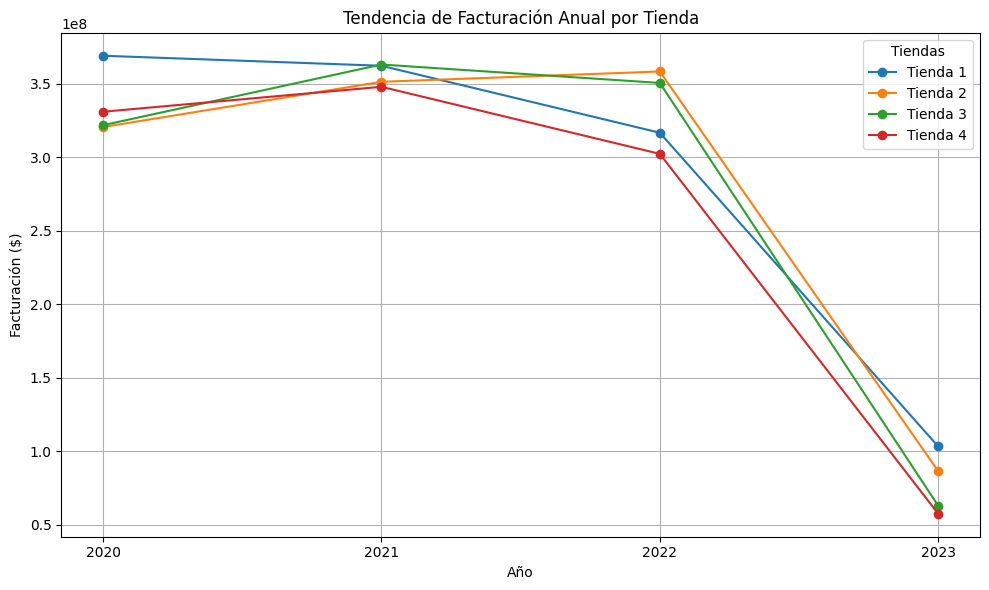


Valores de facturación por tienda y año:

Tienda 1:
  Año 2020: $368,933,200.00
  Año 2021: $362,120,800.00
  Año 2022: $316,565,600.00
  Año 2023: $103,260,800.00

Tienda 2:
  Año 2020: $320,466,600.00
  Año 2021: $351,215,500.00
  Año 2022: $358,226,500.00
  Año 2023: $86,434,900.00

Tienda 3:
  Año 2020: $321,707,500.00
  Año 2021: $362,954,400.00
  Año 2022: $350,438,300.00
  Año 2023: $62,919,400.00

Tienda 4:
  Año 2020: $330,847,700.00
  Año 2021: $347,823,600.00
  Año 2022: $302,221,500.00
  Año 2023: $57,482,900.00


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def analizar_facturacion_por_anio(tienda):
    facturacion_por_anio = {}
    for venta in tienda:
        precio = venta[2]
        fecha = venta[4]
        anio = fecha.split('/')[2]

        if anio not in facturacion_por_anio:
            facturacion_por_anio[anio] = 0
        facturacion_por_anio[anio] += precio

    return facturacion_por_anio

# Método para graficar la facturación comparativa por año de todas las tiendas (gráfico de tendencia)
def graficar_tendencia_anual_todas_las_tiendas(lista_tiendas):
    # Inicializamos las listas para los datos
    anios = []
    tiendas = []
    facturacion_por_tienda = {}

    # Recopilamos la facturación por tienda y por año
    for i, tienda in enumerate(lista_tiendas):
        facturacion_por_anio = analizar_facturacion_por_anio(tienda)
        tiendas.append(f'Tienda {i+1}')
        for anio, facturacion in facturacion_por_anio.items():
            if anio not in anios:
                anios.append(anio)
        facturacion_por_tienda[i] = facturacion_por_anio

    # Ordenamos los años
    anios.sort()

    facturacion_tienda_por_anio = {tienda: [] for tienda in tiendas}

    for tienda, facturacion in facturacion_por_tienda.items():
        for anio in anios:
            facturacion_tienda_por_anio[tiendas[tienda]].append(facturacion.get(anio, 0))

    plt.figure(figsize=(10, 6))

    for i, tienda in enumerate(tiendas):
        plt.plot(anios, facturacion_tienda_por_anio[tienda], marker='o', label=tienda)

    # Etiquetas de la gráfica
    plt.xlabel('Año')
    plt.ylabel('Facturación ($)')
    plt.title('Tendencia de Facturación Anual por Tienda')
    plt.legend(title="Tiendas")

    # Mostrar la gráfica
    plt.tight_layout()
    plt.grid(True)
    plt.show()

    # Mostrar los valores de los puntos en una sección aparte
    print("\nValores de facturación por tienda y año:")
    for i, tienda in enumerate(tiendas):
        print(f"\n{tienda}:")
        for j, anio in enumerate(anios):
            valor = facturacion_tienda_por_anio[tienda][j]
            print(f"  Año {anio}: ${valor:,.2f}")

graficar_tendencia_anual_todas_las_tiendas(todas_las_tiendas)

# 2. Ventas por categoría

In [ ]:
#analisis de manera individual
def contar_productos_por_categoria(tienda):
    conteo_categorias = {}

    for producto in tienda:
        categoria = producto[1]  # Sin validaciones

        if categoria in conteo_categorias:
            conteo_categorias[categoria] += 1
        else:
            conteo_categorias[categoria] = 1

    categorias_ordenadas = sorted(conteo_categorias.items(), key=lambda x: x[1], reverse=True)

    return categorias_ordenadas

contar_productos_por_categoria(lista_tienda)

[('Muebles', 465),
 ('Electrónicos', 448),
 ('Juguetes', 324),
 ('Electrodomésticos', 312),
 ('Deportes y diversión', 284),
 ('Instrumentos musicales', 182),
 ('Libros', 173),
 ('Artículos para el hogar', 171)]

In [ ]:
#analisis general
def analizar_categorias_populares(lista_tiendas):
    for i, tienda in enumerate(lista_tiendas):
        print(f"\n🛍️ Tienda {i+1} - Categorías más populares:")

        categorias = contar_productos_por_categoria(tienda)

        for categoria, cantidad in categorias:
            print(f" - {categoria}: {cantidad} ventas")

analizar_categorias_populares(todas_las_tiendas)


🛍️ Tienda 1 - Categorías más populares:
 - Muebles: 465 ventas
 - Electrónicos: 448 ventas
 - Juguetes: 324 ventas
 - Electrodomésticos: 312 ventas
 - Deportes y diversión: 284 ventas
 - Instrumentos musicales: 182 ventas
 - Libros: 173 ventas
 - Artículos para el hogar: 171 ventas

🛍️ Tienda 2 - Categorías más populares:
 - Muebles: 442 ventas
 - Electrónicos: 422 ventas
 - Juguetes: 313 ventas
 - Electrodomésticos: 305 ventas
 - Deportes y diversión: 275 ventas
 - Instrumentos musicales: 224 ventas
 - Libros: 197 ventas
 - Artículos para el hogar: 181 ventas

🛍️ Tienda 3 - Categorías más populares:
 - Muebles: 499 ventas
 - Electrónicos: 451 ventas
 - Juguetes: 315 ventas
 - Electrodomésticos: 278 ventas
 - Deportes y diversión: 277 ventas
 - Libros: 185 ventas
 - Instrumentos musicales: 177 ventas
 - Artículos para el hogar: 177 ventas

🛍️ Tienda 4 - Categorías más populares:
 - Muebles: 480 ventas
 - Electrónicos: 451 ventas
 - Juguetes: 338 ventas
 - Deportes y diversión: 277 ven

<ipython-input-17-44d63dbd191b>:24: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


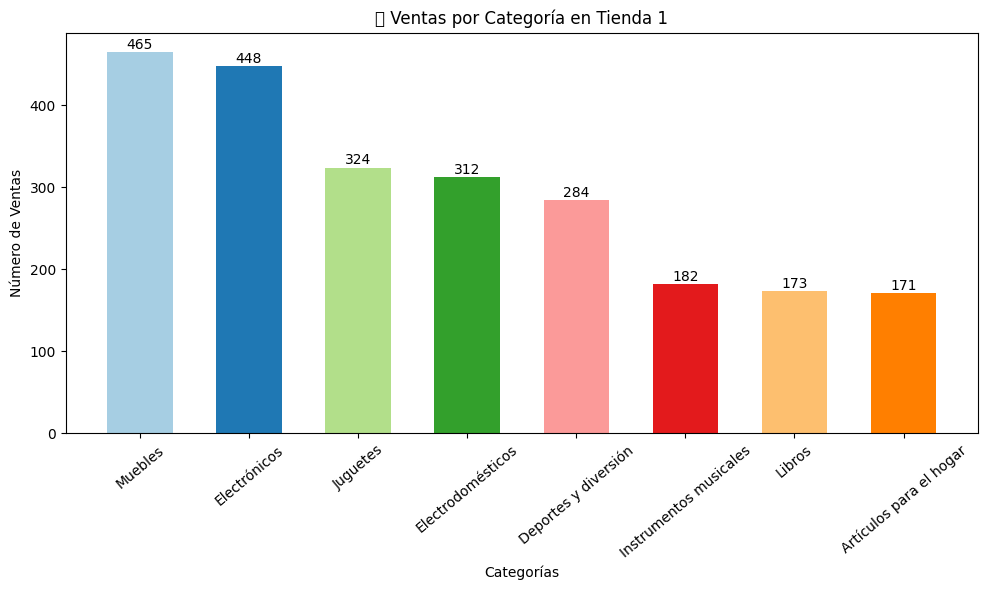

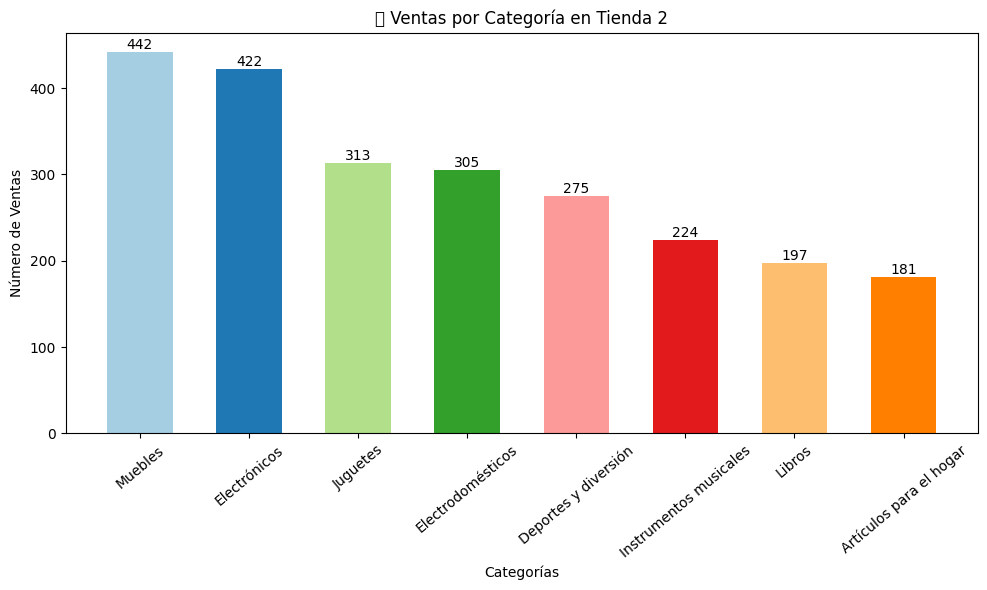

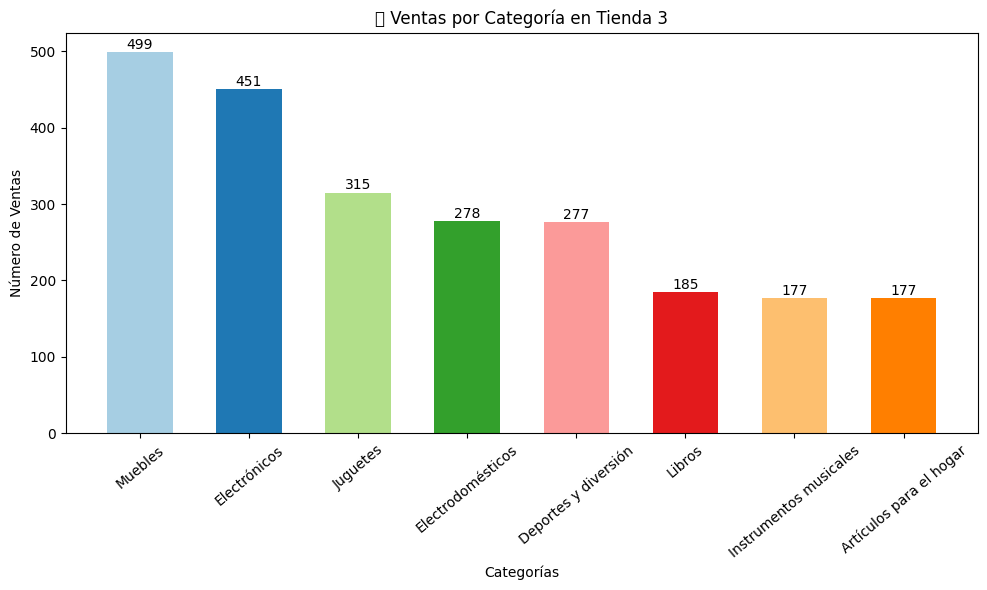

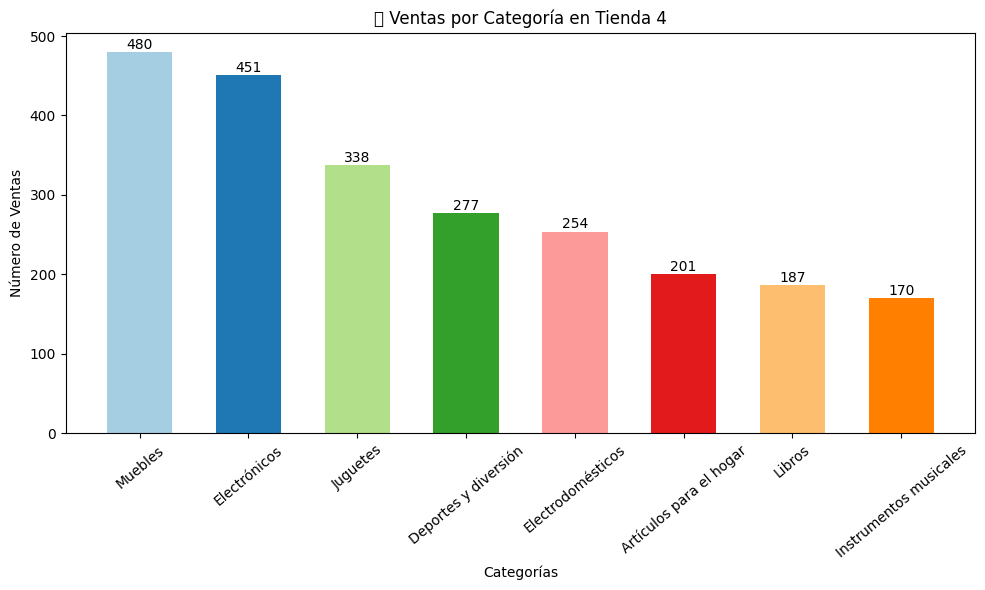

In [ ]:
def graficar_ventas_por_categoria_por_tienda(lista_tiendas):
    for idx, tienda in enumerate(lista_tiendas):
        ventas_por_categoria = contar_productos_por_categoria(tienda)

        categorias = [categoria for categoria, ventas in ventas_por_categoria]
        ventas = [ventas for categoria, ventas in ventas_por_categoria]

        # Asignar un color distinto a cada categoría
        colores = plt.cm.Paired(range(len(categorias)))

        plt.figure(figsize=(10, 6))
        barras = plt.bar(categorias, ventas, color=colores, width=0.6)

        # Mostrar calificación sobre cada barra
        for i, barra in enumerate(barras):
            altura = barra.get_height()
            plt.text(barra.get_x() + barra.get_width()/2.0, altura + 0.1, f'{ventas[i]}',  # Mostrar el número de ventas
                     ha='center', va='bottom', fontsize=10)

        plt.title(f'📊 Ventas por Categoría en Tienda {idx + 1}')
        plt.xlabel('Categorías')
        plt.ylabel('Número de Ventas')
        plt.xticks(rotation=40)
        plt.tight_layout()
        plt.show()

graficar_ventas_por_categoria_por_tienda(todas_las_tiendas)

# 3. Calificación promedio de la tienda


In [ ]:
def calificacion_promedio_tienda(tienda):
    suma_calificaciones = 0
    total_calificaciones = 0

    for producto in tienda:
        calificacion = producto[7]
        suma_calificaciones += calificacion
        total_calificaciones += 1

    promedio = suma_calificaciones / total_calificaciones
    return promedio
calificacion_promedio_tienda(lista_tienda)

3.976685036032217

In [ ]:
def analizar_calificaciones(lista_tiendas):
    print("\n Calificaciones promedio por tienda (ordenadas de mejor a peor):")

    resultados = []

    for i, tienda in enumerate(lista_tiendas):
        promedio = calificacion_promedio_tienda(tienda)
        resultados.append((f"Tienda {i+1}", promedio))

    # Ordenar de mayor a menor calificación
    resultados_ordenados = sorted(resultados, key=lambda x: x[1], reverse=True)

    for nombre, promedio in resultados_ordenados:
        print(f" - {nombre}: {promedio:.2f} estrellas")

todas_las_tiendas = [lista_tienda, lista_tienda2, lista_tienda3, lista_tienda4]
analizar_calificaciones(todas_las_tiendas)


 Calificaciones promedio por tienda (ordenadas de mejor a peor):
 - Tienda 3: 4.05 estrellas
 - Tienda 2: 4.04 estrellas
 - Tienda 4: 4.00 estrellas
 - Tienda 1: 3.98 estrellas


<ipython-input-21-b57a4d17fcc6>:24: UserWarning: Glyph 11088 (\N{WHITE MEDIUM STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


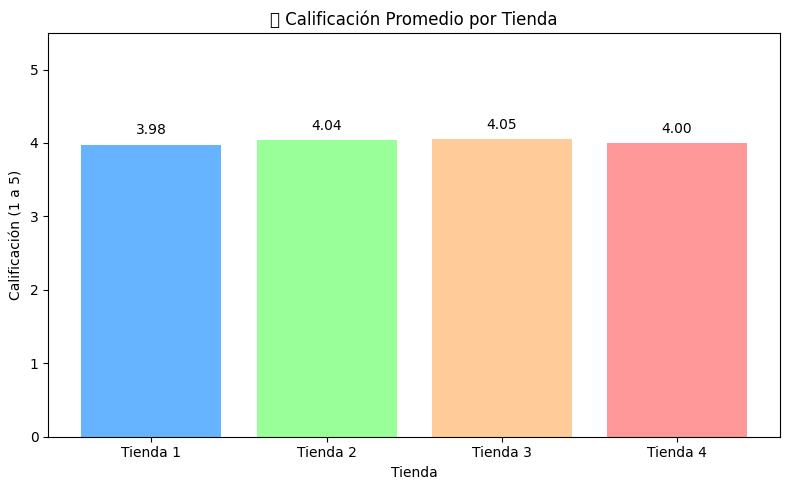

In [ ]:
def graficar_calificaciones_promedio_con_analisis(lista_tiendas):
    calificaciones = []
    for tienda in lista_tiendas:
        promedio = calificacion_promedio_tienda(tienda)
        calificaciones.append(promedio)

    tiendas = [f'Tienda {i+1}' for i in range(len(calificaciones))]

    colores = ['#66b3ff', '#99ff99', '#ffcc99', '#ff9999']

    plt.figure(figsize=(8, 5))
    barras = plt.bar(tiendas, calificaciones, color=colores)

    # Mostrar calificación sobre cada barra
    for i, barra in enumerate(barras):
        altura = barra.get_height()
        plt.text(barra.get_x() + barra.get_width()/2.0, altura + 0.1, f'{calificaciones[i]:.2f}',
                 ha='center', va='bottom', fontsize=10)

    plt.title('⭐ Calificación Promedio por Tienda')
    plt.ylabel('Calificación (1 a 5)')
    plt.ylim(0, 5.5)
    plt.xlabel('Tienda')
    plt.tight_layout()
    plt.show()

graficar_calificaciones_promedio_con_analisis(todas_las_tiendas)

# 4. Productos más y menos vendidos

In [ ]:
def contar_productos_vendidos(tienda):
    conteo_productos = {}

    for producto in tienda:
        nombre = producto[0]  # Columna del nombre del producto

        if nombre in conteo_productos:
            conteo_productos[nombre] += 1
        else:
            conteo_productos[nombre] = 1
    # Ordenar desde el más vendido al menos vendido
    productos_ordenados = sorted(conteo_productos.items(), key=lambda x: x[1], reverse=True)

    return productos_ordenados

contar_productos_vendidos(lista_tienda)

[('Microondas', 60),
 ('TV LED UHD 4K', 60),
 ('Armario', 60),
 ('Secadora de ropa', 58),
 ('Bloques de construcción', 56),
 ('Mesa de noche', 56),
 ('Balón de baloncesto', 55),
 ('Refrigerador', 54),
 ('Bicicleta', 54),
 ('Vaso térmico', 54),
 ('Impresora', 54),
 ('Batería', 53),
 ('Carrito de control remoto', 52),
 ('Cubertería', 52),
 ('Modelado predictivo', 51),
 ('Auriculares', 50),
 ('Ajedrez de madera', 49),
 ('Iphone 15', 49),
 ('Lavavajillas', 48),
 ('Lavadora de ropa', 47),
 ('Guitarra eléctrica', 47),
 ('Silla de oficina', 46),
 ('Sofá reclinable', 46),
 ('Guitarra acústica', 46),
 ('Estufa', 45),
 ('Kit de bancas', 44),
 ('Cama box', 44),
 ('Cubo mágico 8x8', 44),
 ('Mesa de centro', 44),
 ('Cama king', 44),
 ('Smart TV', 44),
 ('Juego de mesa', 43),
 ('Set de ollas', 43),
 ('Smartwatch', 43),
 ('Balón de voleibol', 42),
 ('Dashboards con Power BI', 42),
 ('Tablet ABXY', 42),
 ('Set de vasos', 41),
 ('Sillón', 41),
 ('Iniciando en programación', 41),
 ('Asistente virtual', 

In [ ]:
def analizar_productos_destacados(lista_tiendas):
    print("\n Productos vendidos por tienda (ordenados de más a menos):")

    for i, tienda in enumerate(lista_tiendas):
        print(f"\n Tienda {i+1}:")

        productos_ordenados = contar_productos_vendidos(tienda)

        if not productos_ordenados:
            print(" - No hay datos de productos.")
            continue

        # Mostrar todos los productos ordenados
       # print("Productos vendidos (ordenados):")
       # for nombre, cantidad in productos_ordenados:
       #     print(f" - {nombre}: {cantidad} ventas")

        # Obtener valores máximos y mínimos de ventas
        max_ventas = productos_ordenados[0][1]
        min_ventas = productos_ordenados[-1][1]

        # Filtrar productos empatados en más vendido
        mas_vendidos = [(nombre, cant) for nombre, cant in productos_ordenados if cant == max_ventas]

        # Filtrar productos empatados en menos vendido
        menos_vendidos = [(nombre, cant) for nombre, cant in productos_ordenados if cant == min_ventas]

        # Imprimir resultados destacados
        print("\n 🏅 Más vendidos:")
        for nombre, cant in mas_vendidos:
            print(f"   - {nombre} ({cant} ventas)")

        print(" ⚠️ Menos vendidos:")
        for nombre, cant in menos_vendidos:
            print(f"   - {nombre} ({cant} ventas)")

analizar_productos_destacados(todas_las_tiendas)


 Productos vendidos por tienda (ordenados de más a menos):

 Tienda 1:

 🏅 Más vendidos:
   - Microondas (60 ventas)
   - TV LED UHD 4K (60 ventas)
   - Armario (60 ventas)
 ⚠️ Menos vendidos:
   - Auriculares con micrófono (33 ventas)
   - Celular ABXY (33 ventas)

 Tienda 2:

 🏅 Más vendidos:
   - Iniciando en programación (65 ventas)
 ⚠️ Menos vendidos:
   - Juego de mesa (32 ventas)

 Tienda 3:

 🏅 Más vendidos:
   - Kit de bancas (57 ventas)
 ⚠️ Menos vendidos:
   - Bloques de construcción (35 ventas)

 Tienda 4:

 🏅 Más vendidos:
   - Cama box (62 ventas)
 ⚠️ Menos vendidos:
   - Guitarra eléctrica (33 ventas)


<ipython-input-26-435169b4fdd3>:33: UserWarning: Glyph 127942 (\N{TROPHY}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


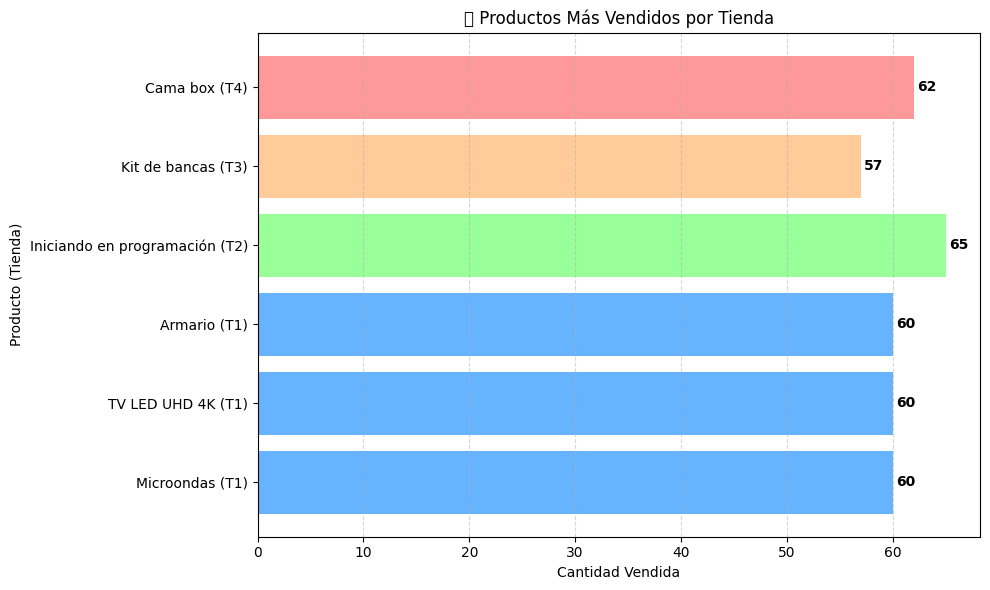

In [ ]:
def graficar_productos_mas_vendidos_barras_acostadas(lista_tiendas):
    nombres_productos = []
    cantidades = []
    colores = ['#66b3ff', '#99ff99', '#ffcc99', '#ff9999']
    colores_barras = []
    etiquetas_barras = []

    for idx, tienda in enumerate(lista_tiendas):
        productos_contados = contar_productos_vendidos(tienda)
        if not productos_contados:
            continue

        max_ventas = productos_contados[0][1]
        productos_top = [(prod, cant) for prod, cant in productos_contados if cant == max_ventas]

        for prod, cant in productos_top:
            nombres_productos.append(f"{prod} (T{idx+1})")
            cantidades.append(cant)
            colores_barras.append(colores[idx % len(colores)])
            etiquetas_barras.append(f"Tienda {idx+1}")

    plt.figure(figsize=(10, 6))
    barras = plt.barh(nombres_productos, cantidades, color=colores_barras)

    for barra, cantidad in zip(barras, cantidades):
        plt.text(cantidad + 0.3, barra.get_y() + barra.get_height() / 2,
                 str(cantidad), va='center', fontsize=10, weight='bold')

    plt.title('🏆 Productos Más Vendidos por Tienda')
    plt.xlabel('Cantidad Vendida')
    plt.ylabel('Producto (Tienda)')
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

graficar_productos_mas_vendidos_barras_acostadas(todas_las_tiendas)

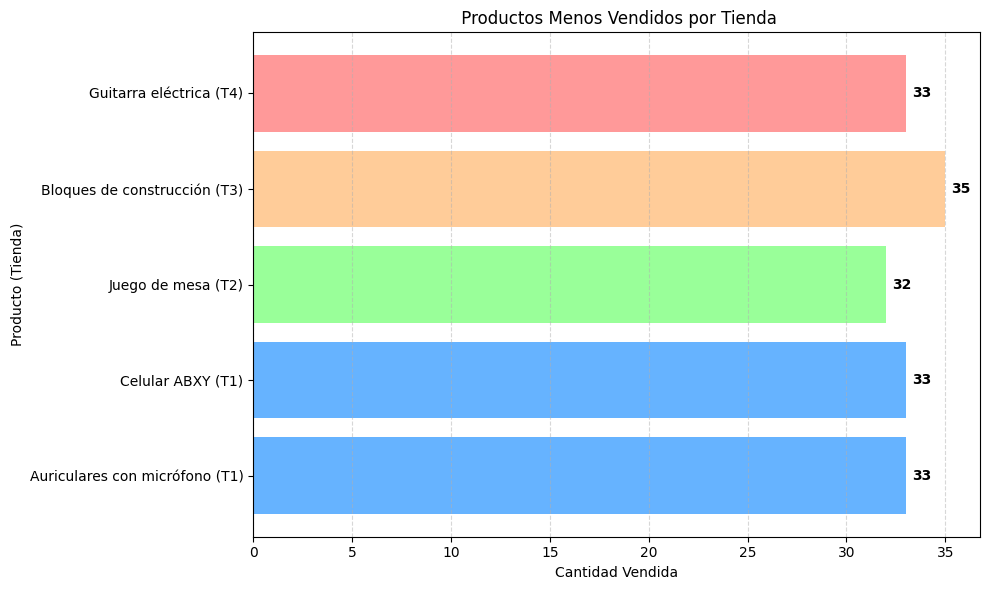

In [ ]:
def graficar_productos_menos_vendidos_barras_acostadas(lista_tiendas):
    nombres_productos = []
    cantidades = []
    colores = ['#66b3ff', '#99ff99', '#ffcc99', '#ff9999']
    colores_barras = []
    etiquetas_barras = []

    for idx, tienda in enumerate(lista_tiendas):
        productos_contados = contar_productos_vendidos(tienda)
        if not productos_contados:
            continue

        min_ventas = productos_contados[-1][1]  # Último elemento al estar ordenados de mayor a menor
        productos_min = [(prod, cant) for prod, cant in productos_contados if cant == min_ventas]

        for prod, cant in productos_min:
            nombres_productos.append(f"{prod} (T{idx+1})")
            cantidades.append(cant)
            colores_barras.append(colores[idx % len(colores)])
            etiquetas_barras.append(f"Tienda {idx+1}")

    plt.figure(figsize=(10, 6))
    barras = plt.barh(nombres_productos, cantidades, color=colores_barras)

    for barra, cantidad in zip(barras, cantidades):
        plt.text(cantidad + 0.3, barra.get_y() + barra.get_height() / 2,
                 str(cantidad), va='center', fontsize=10, weight='bold')

    plt.title(' Productos Menos Vendidos por Tienda')
    plt.xlabel('Cantidad Vendida')
    plt.ylabel('Producto (Tienda)')
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

graficar_productos_menos_vendidos_barras_acostadas(todas_las_tiendas)

# 5. Envío promedio por tienda

In [ ]:
def calcular_costo_envio_promedio(tienda):
    total_costo_envio = 0
    total_productos = 0

    for producto in tienda:
        costo_envio = float(producto[3])
        total_costo_envio += costo_envio
        total_productos += 1

    # Evitar división por cero si no hay productos
    if total_productos == 0:
        return 0

    return total_costo_envio / total_productos

calcular_costo_envio_promedio(lista_tienda)

26018.60958033065

In [ ]:
def analizar_costo_envio_promedio(lista_tiendas):
    print("\n Costo de envío promedio por tienda:")

    for i, tienda in enumerate(lista_tiendas):
        costo_promedio = calcular_costo_envio_promedio(tienda)

        print(f"\n Tienda {i+1}: Costo promedio de envío: ${costo_promedio:.2f}")

analizar_costo_envio_promedio(todas_las_tiendas)


 Costo de envío promedio por tienda:

 Tienda 1: Costo promedio de envío: $26018.61

 Tienda 2: Costo promedio de envío: $25216.24

 Tienda 3: Costo promedio de envío: $24805.68

 Tienda 4: Costo promedio de envío: $23459.46


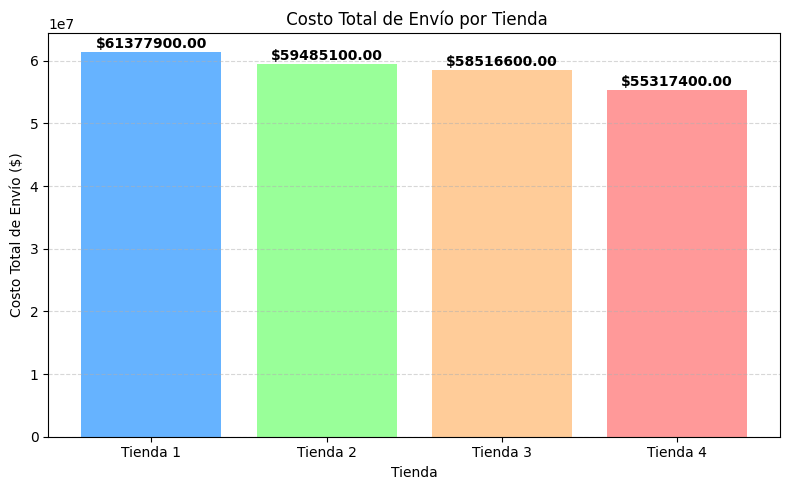

In [ ]:
def graficar_costo_envio_total_por_tienda(lista_tiendas):
    costos = []
    etiquetas = []

    for i, tienda in enumerate(lista_tiendas):
        costo_total = 0
        for venta in tienda:
            try:
                costo_envio = float(venta[3])
                costo_total += costo_envio
            except (ValueError, IndexError):
                continue  # Salta filas mal formateadas

        costos.append(costo_total)
        etiquetas.append(f'Tienda {i+1}')

    colores = ['#66b3ff', '#99ff99', '#ffcc99', '#ff9999']

    plt.figure(figsize=(8, 5))
    barras = plt.bar(etiquetas, costos, color=colores)

    for i, costo in enumerate(costos):
        plt.text(i, costo + max(costos) * 0.01, f"${costo:.2f}", ha='center', fontsize=10, weight='bold')

    plt.title(' Costo Total de Envío por Tienda')
    plt.xlabel('Tienda')
    plt.ylabel('Costo Total de Envío ($)')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

graficar_costo_envio_total_por_tienda(todas_las_tiendas)

# 6. Extras

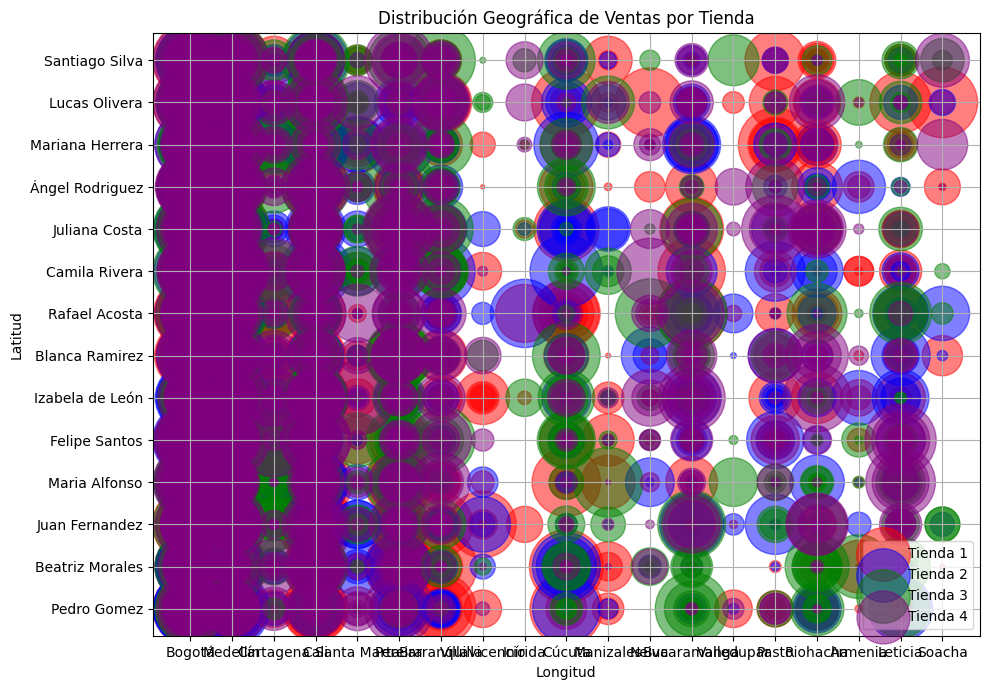

In [ ]:
import matplotlib.pyplot as plt

def graficar_mapa_geografico_por_tienda(lista_tiendas):
    colores = ['red', 'blue', 'green', 'purple']

    plt.figure(figsize=(10, 7))
    for idx, tienda in enumerate(lista_tiendas):
        latitudes = [venta[5] for venta in tienda]
        longitudes = [venta[6] for venta in tienda]
        precios = [venta[2] for venta in tienda]

        plt.scatter(longitudes, latitudes,
                    s=[p/1000 for p in precios],
                    alpha=0.5,
                    c=colores[idx],
                    label=f'Tienda {idx + 1}')

    plt.title('Distribución Geográfica de Ventas por Tienda')
    plt.xlabel('Longitud')
    plt.ylabel('Latitud')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

graficar_mapa_geografico_por_tienda(todas_las_tiendas)

In [36]:
import folium

def generar_mapa_ventas(lista_tiendas):
    # Centro aproximado de México para iniciar el mapa
    mapa = folium.Map(location=[5.545614355868265, -73.35813021336637], zoom_start=5)

    colores_tiendas = ['red', 'blue', 'green', 'orange']

    for i, tienda in enumerate(lista_tiendas):
        color = colores_tiendas[i % len(colores_tiendas)]
        for venta in tienda:
            try:
                lat = float(venta[10])
                lon = float(venta[11])
                folium.CircleMarker(
                    location=[lat, lon],
                    radius=3,
                    color=color,
                    fill=True,
                    fill_opacity=0.6,
                    popup=f'Tienda {i+1}'
                ).add_to(mapa)
            except Exception as e:
                print(f"Error en la venta {venta}: {e}")

    return mapa
# Generar el mapa
mapa_ventas = generar_mapa_ventas([lista_tienda, lista_tienda2, lista_tienda3, lista_tienda4])

# Mostrar el map
mapa_ventas

# 7. Analisis

Interpretando los datos obtenidos si comparamos solo ingresos brutos la tienda 1 es la mejor siendo la **tienda 4** la mas baja por consiguiente la candidata a ser vendida, sin embargo, con un enfoque más integral tenemos que la tienda 3 es la mas balanceada y prometedora, debido a su buen puntaje en calificación, ser la segunda en ventas totales y tener un manejo adecuado en el costo de envió, así como ser bastante estable en sus productos y categorías más vendidos.
La recomendación adecuada es si es necesario liquidar una tienda en este momento se reafirma ser la tienda 4, sin embargo, si la decisión es aplazada es necesario tener en cuenta las siguientes recomendaciones:


*   Tienda 1: Reforzar servicio al cliente y logística. Potencial alto, pero necesita eficiencia.
*   Tienda 2: Mantener calidad y considerar mejorar envíos.
*   Tienda 3: Ideal para invertir o replicar su estrategia.
*   Tienda 4: Puede mejorar marketing; tiene buena logística, pero falta impulso en ventas.

**Comentario final:**
Tras implementar estas recomendaciones seria adecuado realizar un nuevo análisis de las tiendas y determinar si la tienda candidata a venta (**tienda 4**) demuestra o no, una mejora en su productividad.
